In [28]:
import pandas as pd
import numpy as np
import random as rm 
import yfinance as yf
import plotly.express as px 
import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report 
import seaborn as sns 

## Using information from Different African Countries to predict Economic Well being of the Country

In [15]:
## Import the train and test variables form the .csv file

In [16]:
train = pd.read_csv(r"C:\Users\ppiko\Documents\3. LBS - MBA 20\MBA 20 - Olumide Obanla\1. Data Analysis Club Exercise and Video\Zindi Africa\Done\Economic-Well-being-Prediction\Train.csv")

In [17]:
test = pd.read_csv(r"C:\Users\ppiko\Documents\3. LBS - MBA 20\MBA 20 - Olumide Obanla\1. Data Analysis Club Exercise and Video\Zindi Africa\Done\Economic-Well-being-Prediction\Test.csv")

In [18]:
train 

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21449,ID_zzPvDPjQ,Nigeria,2013,R,0.0,0.002961,0.008240,0.002313,0.008068,0.978418,44.044352,12.551978,6.302902,0.000000,0.000000,1.955632,283.861037,159.790057,0.624088
21450,ID_zzQoPhjZ,Senegal,2011,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,27.848571,0.372267,0.000000,0.000000,0.000000,295.307249,122.976960,0.250042
21451,ID_zzQuWZBF,Ghana,2014,R,0.0,0.000536,0.000092,0.000018,0.000074,0.999279,0.458143,3.679934,1.712136,0.000000,0.000000,0.442422,166.405249,155.365355,0.314871
21452,ID_zzqCGLvb,Ghana,2014,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,12.331763,0.960163,0.001899,0.061126,0.000000,568.759665,534.638628,0.237831


In [19]:
test 

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,ID_AAcismbB,Democratic Republic of Congo,2007,R,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,ID_AAeBMsji,Democratic Republic of Congo,2007,U,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,ID_AAjFMjzy,Uganda,2011,U,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,ID_AAmMOEEC,Burkina Faso,2010,U,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,ID_ABguzDxp,Zambia,2007,R,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7189,ID_zxzKJCMI,Zimbabwe,2010,R,0.000000,0.000000,0.000000,0.000016,0.000131,0.999853,0.304446,32.263180,0.658724,0.000000,0.077742,0.103892,500.988790,703.139988
7190,ID_zyBrpgRp,Uganda,2011,U,0.000000,0.000056,0.000883,0.003861,0.002483,0.992717,36.160182,27.520555,3.615442,0.000000,0.001157,0.000000,159.587852,1000.194893
7191,ID_zyMafcYq,Burkina Faso,2010,U,0.002683,0.000268,0.002800,0.009322,0.042527,0.942399,46.127465,35.674511,12.705561,0.001129,0.723252,4.734974,33.775441,781.833777
7192,ID_zyfMsHMG,Zimbabwe,2011,R,0.000332,0.000000,0.000017,0.000000,0.000100,0.999551,0.309696,18.050789,0.030514,0.033177,0.222629,0.175123,320.974153,605.920204


In [20]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21454 entries, 0 to 21453
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   ID                                       21454 non-null  object 
 1   country                                  21454 non-null  object 
 2   year                                     21454 non-null  int64  
 3   urban_or_rural                           21454 non-null  object 
 4   ghsl_water_surface                       21454 non-null  float64
 5   ghsl_built_pre_1975                      21454 non-null  float64
 6   ghsl_built_1975_to_1990                  21454 non-null  float64
 7   ghsl_built_1990_to_2000                  21454 non-null  float64
 8   ghsl_built_2000_to_2014                  21454 non-null  float64
 9   ghsl_not_built_up                        21454 non-null  float64
 10  ghsl_pop_density                         21454

In [21]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7194 entries, 0 to 7193
Data columns (total 18 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   ID                                       7194 non-null   object 
 1   country                                  7194 non-null   object 
 2   year                                     7194 non-null   int64  
 3   urban_or_rural                           7194 non-null   object 
 4   ghsl_water_surface                       7194 non-null   float64
 5   ghsl_built_pre_1975                      7194 non-null   float64
 6   ghsl_built_1975_to_1990                  7194 non-null   float64
 7   ghsl_built_1990_to_2000                  7194 non-null   float64
 8   ghsl_built_2000_to_2014                  7194 non-null   float64
 9   ghsl_not_built_up                        7194 non-null   float64
 10  ghsl_pop_density                         7194 no

In [22]:
train.isnull().sum()

ID                                         0
country                                    0
year                                       0
urban_or_rural                             0
ghsl_water_surface                         0
ghsl_built_pre_1975                        0
ghsl_built_1975_to_1990                    0
ghsl_built_1990_to_2000                    0
ghsl_built_2000_to_2014                    0
ghsl_not_built_up                          0
ghsl_pop_density                           0
landcover_crops_fraction                   0
landcover_urban_fraction                   0
landcover_water_permanent_10km_fraction    0
landcover_water_seasonal_10km_fraction     0
nighttime_lights                           0
dist_to_capital                            0
dist_to_shoreline                          0
Target                                     0
dtype: int64

In [23]:
test.isnull().sum()

ID                                         0
country                                    0
year                                       0
urban_or_rural                             0
ghsl_water_surface                         0
ghsl_built_pre_1975                        0
ghsl_built_1975_to_1990                    0
ghsl_built_1990_to_2000                    0
ghsl_built_2000_to_2014                    0
ghsl_not_built_up                          0
ghsl_pop_density                           0
landcover_crops_fraction                   0
landcover_urban_fraction                   0
landcover_water_permanent_10km_fraction    0
landcover_water_seasonal_10km_fraction     0
nighttime_lights                           0
dist_to_capital                            0
dist_to_shoreline                          0
dtype: int64

In [24]:
train.describe()

,year,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
count,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000
mean,2010.060874,0.028259,0.038222,0.028644,0.012689,0.018386,0.873800,95.756775,21.034265,13.999061,1.486849,0.714891,8.506543,289.722268,402.608539,0.350736
std,4.799579,0.097490,0.113562,0.077367,0.032745,0.040421,0.239294,209.704761,16.751106,23.715485,6.550171,2.383701,21.090378,238.811778,321.517285,0.194376
min,1994.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000859,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.105306,0.112080,0.000000
25%,2008.000000,0.000000,0.000000,0.000000,0.000043,0.000124,0.897867,3.848533,5.610515,0.798841,0.000000,0.001325,0.000000,115.890873,126.379463,0.195772
50%,2011.000000,0.000000,0.000198,0.000709,0.001001,0.001871,0.991919,17.632672,18.509291,2.770159,0.000516,0.029151,0.137333,256.736472,327.271973,0.293574
75%,2014.000000,0.000000,0.007987,0.009868,0.008128,0.014936,0.999532,63.225683,33.590293,12.621501,0.152364,0.381969,4.830194,401.153071,643.910675,0.499003
max,2016.000000,0.969956,0.877116,0.685010,0.515534,0.649159,1.000000,1741.256516,80.064918,98.784092,99.164018,56.201637,382.932769,1897.351575,1769.523906,1.000000


In [25]:
test.describe()

,year,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
count,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000
mean,2010.899778,0.023317,0.049325,0.025364,0.016767,0.018319,0.866908,93.147365,21.285033,14.318006,2.212083,0.634295,11.508951,332.979023,686.113119
std,3.651409,0.087915,0.132582,0.057233,0.038079,0.039703,0.252557,211.196451,14.916804,24.510227,8.683106,2.383202,37.313751,341.906808,368.546747
min,1998.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.437825,0.898246
25%,2010.000000,0.000000,0.000000,0.000000,0.000019,0.000075,0.889836,1.071279,7.855023,0.459067,0.000000,0.001444,0.000000,101.060708,409.104775
50%,2011.000000,0.000000,0.000089,0.000320,0.000720,0.001359,0.994922,12.290615,21.105082,2.087011,0.002072,0.052594,0.000000,241.468141,759.849023
75%,2014.000000,0.000000,0.008020,0.010774,0.012036,0.015915,0.999738,66.695301,31.998608,14.174194,0.222664,0.351605,5.543974,415.621994,954.987511
max,2016.000000,0.991100,0.894608,0.506349,0.275297,0.359931,1.000000,1902.876955,74.401875,97.210607,96.978486,47.232629,403.455783,1908.105037,1748.559242


In [49]:
## Exploratory Data Analysis of the different features with the target 
## GHSL stand for Global Human Settlement Layer 

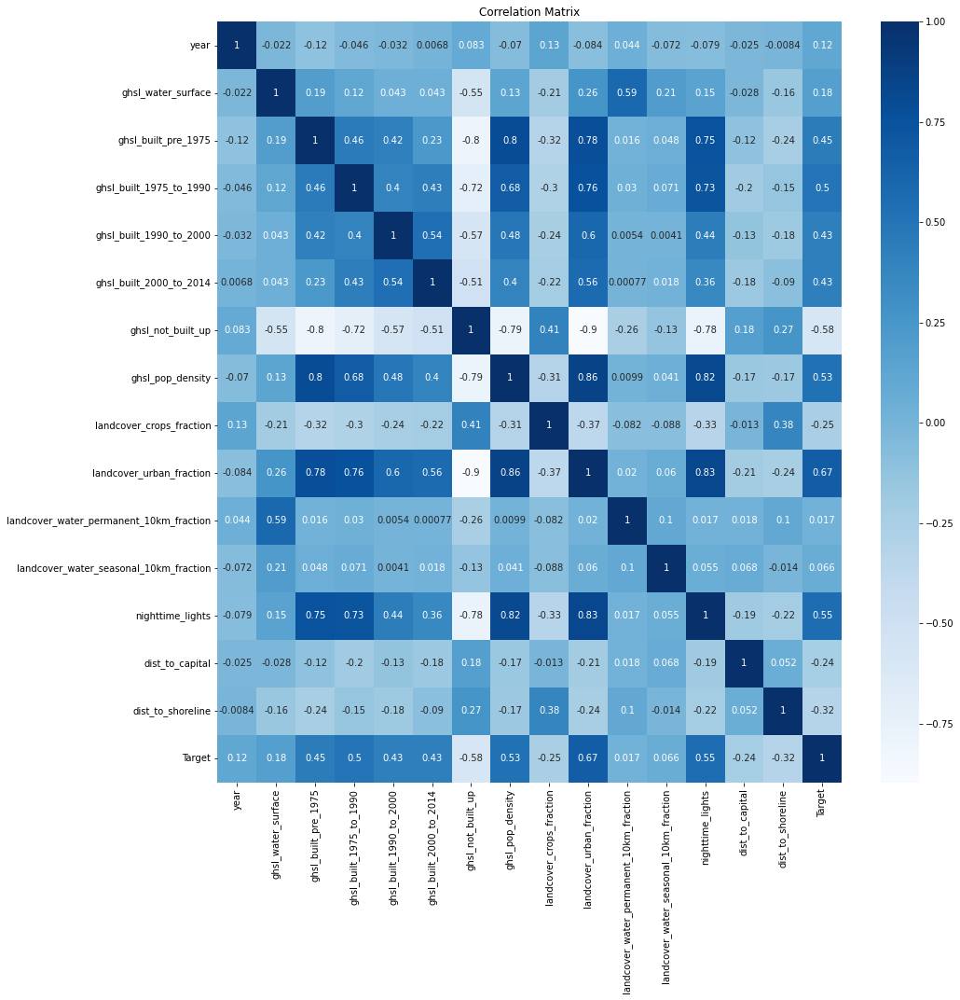

In [38]:
plt.figure(figsize=(15,15))
sns.heatmap(train.corr(), cmap='Blues', annot=True)
plt.title("Correlation Matrix");

In [42]:
train.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline', 'Target'],
      dtype='object')

In [50]:
px.scatter(train, y="Target", x="year", hover_name="country", color="urban_or_rural", size="ghsl_built_pre_1975", log_x=True,
          height=1000,width=1000, title="GHSL in 1975 in Relation to Economical Wellbeing")

In [52]:
px.scatter(train, y="Target", x="year", hover_name="country", color="urban_or_rural", size="ghsl_built_1975_to_1990", log_x=True,
          height=1000,width=1000, title="GHSL Btwn (1975 - 1990) in Relation to Economical Wellbeing Target")

In [53]:
px.scatter(train, y="Target", x="year", hover_name="country", color="urban_or_rural", size="ghsl_built_2000_to_2014", log_x=True,
          height=1000,width=1000, title="GHSL Btwn (2000 - 2014) in Relation to Economical Wellbeing Target")

In [77]:
%%time
px.histogram(train, x="year",color="urban_or_rural", hover_name="country", marginal="rug")

Wall time: 105 ms


In [71]:
train.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline', 'Target'],
      dtype='object')

<AxesSubplot:xlabel='ghsl_built_1975_to_1990', ylabel='Target'>

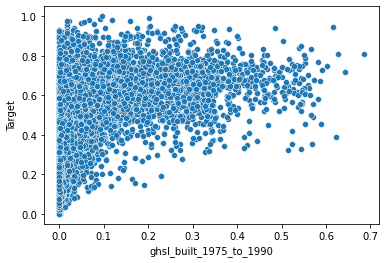

In [80]:
sns.scatterplot(data=train, x="ghsl_built_1975_to_1990", y="Target")

<AxesSubplot:xlabel='ghsl_built_1990_to_2000', ylabel='Target'>

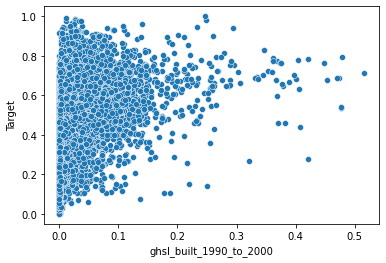

In [81]:
sns.scatterplot(data=train, x="ghsl_built_1990_to_2000", y="Target")

<AxesSubplot:xlabel='ghsl_built_2000_to_2014', ylabel='Target'>

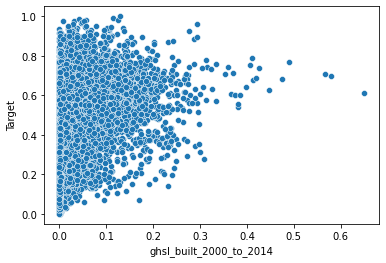

In [82]:
sns.scatterplot(data=train, x="ghsl_built_2000_to_2014", y="Target")

In [84]:
train.groupby("country").sum()

,year,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
country,,,,,,,,,,,,,,,,
Cameroon,2090203,14.054691,93.032203,42.943986,21.658811,10.784486,858.525823,213696.958763,11900.909980,21434.221133,447.754782,709.922016,12696.127994,3.123918e+05,3.256935e+05,398.107032
Central African Republic,460704,6.218998,16.335665,1.198860,4.234434,1.770423,201.241620,20598.243335,1764.657993,3003.296631,336.718532,151.810511,661.709287,6.072099e+04,2.360450e+05,48.039230
Cote d'Ivoire,965830,18.589008,78.252120,6.880925,6.943039,9.296283,361.038626,73698.515341,2700.939493,10960.531736,214.584479,227.563524,10797.406023,9.903400e+04,9.155030e+04,228.319761
Ethiopia,3460873,4.574328,23.376685,37.395586,14.583705,24.530186,1616.539509,188393.018523,43949.608713,16246.882040,608.034942,286.461326,12073.955067,5.631433e+05,8.225388e+05,401.519400
Ghana,2849605,62.498077,140.035705,69.268919,47.610054,39.877107,1059.710138,166839.691602,16564.112743,32730.426993,1978.846070,1063.756615,22769.601956,3.406199e+05,2.846865e+05,683.957133
Guinea,1189307,40.099645,39.890911,20.129886,9.319441,12.521281,471.038836,58351.794507,3094.176327,12213.550463,349.785238,517.763828,2899.977937,1.553573e+05,1.133028e+05,198.381470
Kenya,5282454,54.897212,20.865424,38.895449,17.512101,26.056196,2467.773619,211462.533026,76847.083264,26878.795914,4390.472270,1021.771887,18210.416808,6.379912e+05,1.240536e+06,939.489341
Lesotho,1597198,0.014924,1.161012,18.208525,10.647978,11.563986,752.403575,14816.326622,16667.925849,4936.327421,90.579238,174.375437,3224.288917,6.796448e+04,2.094959e+05,287.361750
Malawi,3938929,56.994235,29.396658,15.826749,21.690368,41.299859,1791.792130,70185.969136,48263.558763,16278.755605,8625.963329,491.736285,7351.605570,3.962387e+05,9.140789e+05,529.956257


<AxesSubplot:xlabel='year', ylabel='Target'>

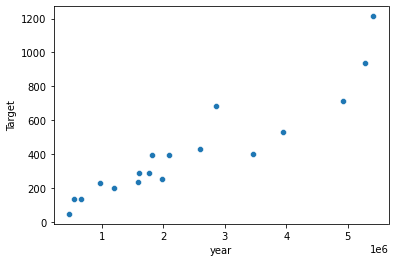

In [85]:
sns.scatterplot(data=train.groupby("country").sum(), x="year", y="Target")

C:\Users\ppiko\anaconda33\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Target'>

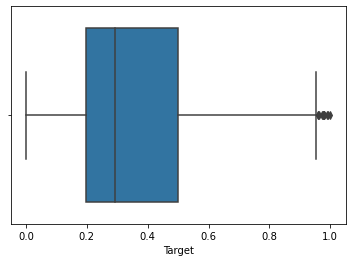

In [89]:
sns.boxplot(train.Target)

In [96]:
train.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328


In [97]:
test.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,ID_AAcismbB,Democratic Republic of Congo,2007,R,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,ID_AAeBMsji,Democratic Republic of Congo,2007,U,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,ID_AAjFMjzy,Uganda,2011,U,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,ID_AAmMOEEC,Burkina Faso,2010,U,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,ID_ABguzDxp,Zambia,2007,R,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501


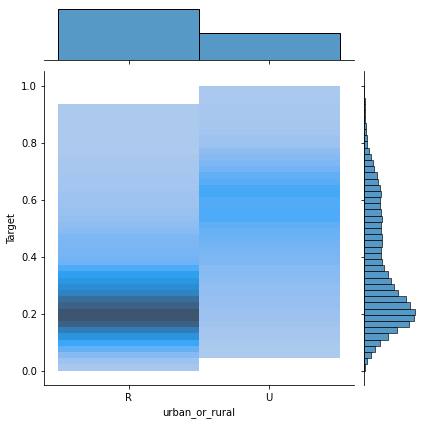

In [106]:
sns.jointplot(x="urban_or_rural", y="Target", data=train, kind="hist");

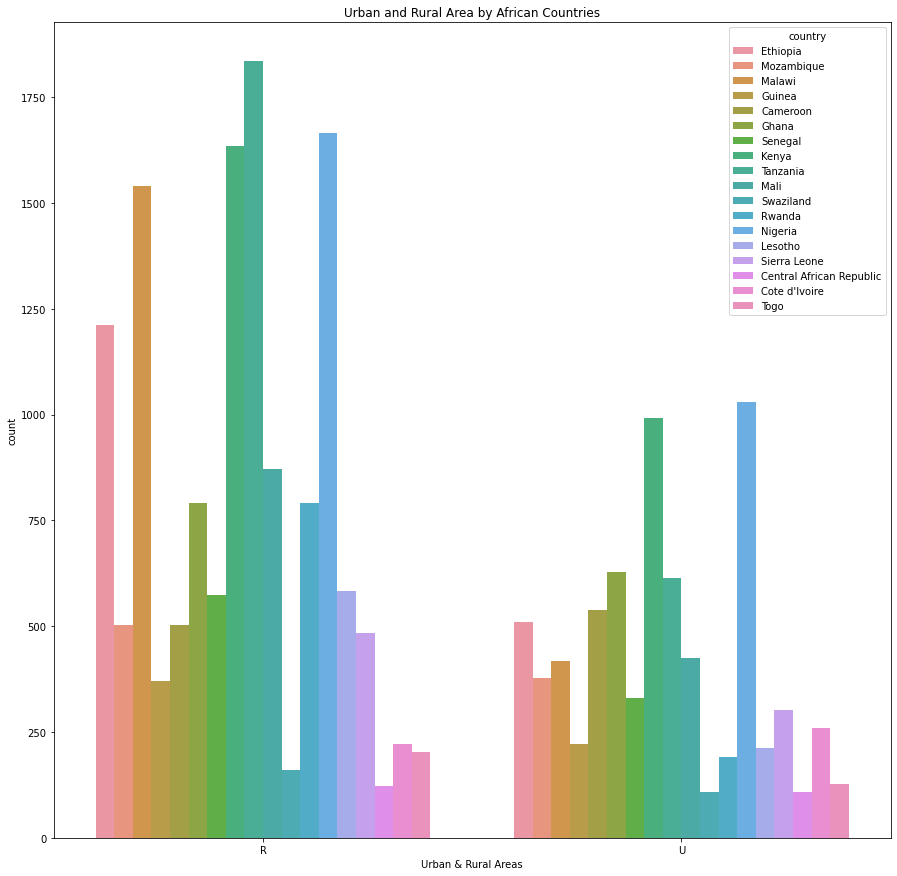

In [115]:
plt.figure(figsize=(15,15))
sns.countplot(x="urban_or_rural", data=train, hue="country");
plt.xlabel("Urban & Rural Areas")
plt.title("Urban and Rural Area by African Countries");


In [120]:
rural = {"R":1, "U":0}

In [121]:
rural_numeric = train.urban_or_rural.map(rural)

In [122]:
rural_numeric

0        1
1        1
2        1
3        1
4        0
        ..
21449    1
21450    1
21451    1
21452    1
21453    1
Name: urban_or_rural, Length: 21454, dtype: int64

In [123]:
train.Target.corr(rural_numeric)

-0.6781866164652915

In [124]:
urban = {"U":1, "R":0}

In [125]:
urban_numeric = train.urban_or_rural.map(urban)

In [126]:
train.Target.corr(urban_numeric)

0.6781866164652915

In [127]:
train['urban_or_rural'] = train['urban_or_rural'].map({'U':1,'R':0})

In [128]:
train 

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
0,ID_AAIethGy,Ethiopia,2016,0,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783
1,ID_AAYiaCeL,Ethiopia,2005,0,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898
2,ID_AAdurmKj,Mozambique,2009,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320
3,ID_AAgNHles,Malawi,2015,0,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107
4,ID_AAishfND,Guinea,2012,1,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21449,ID_zzPvDPjQ,Nigeria,2013,0,0.0,0.002961,0.008240,0.002313,0.008068,0.978418,44.044352,12.551978,6.302902,0.000000,0.000000,1.955632,283.861037,159.790057,0.624088
21450,ID_zzQoPhjZ,Senegal,2011,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,27.848571,0.372267,0.000000,0.000000,0.000000,295.307249,122.976960,0.250042
21451,ID_zzQuWZBF,Ghana,2014,0,0.0,0.000536,0.000092,0.000018,0.000074,0.999279,0.458143,3.679934,1.712136,0.000000,0.000000,0.442422,166.405249,155.365355,0.314871
21452,ID_zzqCGLvb,Ghana,2014,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,12.331763,0.960163,0.001899,0.061126,0.000000,568.759665,534.638628,0.237831


In [129]:
test['urban_or_rural'] = test['urban_or_rural'].map({'U':1,'R':0})

In [130]:
test.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,ID_AAcismbB,Democratic Republic of Congo,2007,0,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,ID_AAeBMsji,Democratic Republic of Congo,2007,1,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,ID_AAjFMjzy,Uganda,2011,1,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,ID_AAmMOEEC,Burkina Faso,2010,1,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,ID_ABguzDxp,Zambia,2007,0,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501


In [133]:
id = test['ID']

In [134]:
id

0       ID_AAcismbB
1       ID_AAeBMsji
2       ID_AAjFMjzy
3       ID_AAmMOEEC
4       ID_ABguzDxp
           ...     
7189    ID_zxzKJCMI
7190    ID_zyBrpgRp
7191    ID_zyMafcYq
7192    ID_zyfMsHMG
7193    ID_zytUOqJv
Name: ID, Length: 7194, dtype: object

In [135]:
train.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline', 'Target'],
      dtype='object')

In [139]:
X = train[['urban_or_rural', 'ghsl_water_surface','ghsl_built_pre_1975', 'ghsl_built_1975_to_1990','ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction','landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights','dist_to_capital', 'dist_to_shoreline']]

In [140]:
X

,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,0,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378
1,0,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243
2,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773
3,0,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610
4,1,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21449,0,0.0,0.002961,0.008240,0.002313,0.008068,0.978418,44.044352,12.551978,6.302902,0.000000,0.000000,1.955632,283.861037,159.790057
21450,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,27.848571,0.372267,0.000000,0.000000,0.000000,295.307249,122.976960
21451,0,0.0,0.000536,0.000092,0.000018,0.000074,0.999279,0.458143,3.679934,1.712136,0.000000,0.000000,0.442422,166.405249,155.365355
21452,0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,12.331763,0.960163,0.001899,0.061126,0.000000,568.759665,534.638628


In [143]:
y = train[['Target']]

In [144]:
y

,Target
0,0.132783
1,0.004898
2,0.097320
3,0.304107
4,0.605328
...,...
21449,0.624088
21450,0.250042
21451,0.314871
21452,0.237831


In [145]:
Test = test[['urban_or_rural', 'ghsl_water_surface','ghsl_built_pre_1975', 'ghsl_built_1975_to_1990','ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction','landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights','dist_to_capital', 'dist_to_shoreline']]

In [146]:
Test

,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,0,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,1,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,1,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,1,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,0,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7189,0,0.000000,0.000000,0.000000,0.000016,0.000131,0.999853,0.304446,32.263180,0.658724,0.000000,0.077742,0.103892,500.988790,703.139988
7190,1,0.000000,0.000056,0.000883,0.003861,0.002483,0.992717,36.160182,27.520555,3.615442,0.000000,0.001157,0.000000,159.587852,1000.194893
7191,1,0.002683,0.000268,0.002800,0.009322,0.042527,0.942399,46.127465,35.674511,12.705561,0.001129,0.723252,4.734974,33.775441,781.833777
7192,0,0.000332,0.000000,0.000017,0.000000,0.000100,0.999551,0.309696,18.050789,0.030514,0.033177,0.222629,0.175123,320.974153,605.920204


In [150]:
Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7194 entries, 0 to 7193
Data columns (total 15 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   urban_or_rural                           7194 non-null   int64  
 1   ghsl_water_surface                       7194 non-null   float64
 2   ghsl_built_pre_1975                      7194 non-null   float64
 3   ghsl_built_1975_to_1990                  7194 non-null   float64
 4   ghsl_built_1990_to_2000                  7194 non-null   float64
 5   ghsl_built_2000_to_2014                  7194 non-null   float64
 6   ghsl_not_built_up                        7194 non-null   float64
 7   ghsl_pop_density                         7194 non-null   float64
 8   landcover_crops_fraction                 7194 non-null   float64
 9   landcover_urban_fraction                 7194 non-null   float64
 10  landcover_water_permanent_10km_fraction  7194 no

In [151]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21454 entries, 0 to 21453
Data columns (total 15 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   urban_or_rural                           21454 non-null  int64  
 1   ghsl_water_surface                       21454 non-null  float64
 2   ghsl_built_pre_1975                      21454 non-null  float64
 3   ghsl_built_1975_to_1990                  21454 non-null  float64
 4   ghsl_built_1990_to_2000                  21454 non-null  float64
 5   ghsl_built_2000_to_2014                  21454 non-null  float64
 6   ghsl_not_built_up                        21454 non-null  float64
 7   ghsl_pop_density                         21454 non-null  float64
 8   landcover_crops_fraction                 21454 non-null  float64
 9   landcover_urban_fraction                 21454 non-null  float64
 10  landcover_water_permanent_10km_fraction  21454

In [153]:
## Modelling of the Data Set
## We will be using Linear Regression to build the model


In [154]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2, random_state=101)

In [155]:
X_train

,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
19063,1,0.000000,0.000014,0.009752,0.011093,0.009841,0.969299,18.370150,19.805342,1.688547,0.016578,0.047817,2.877871,101.209844,310.061849
4250,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.254065,0.024038,0.000000,0.000845,0.000000,476.432771,196.127564
13348,0,0.000000,0.000000,0.000039,0.000875,0.000704,0.998382,2.702316,35.778351,1.116166,0.000000,0.077835,0.000000,378.866029,548.662226
11865,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,12.995146,0.054045,0.000000,0.001707,0.000000,259.913092,598.270738
16912,0,0.083363,0.000226,0.002134,0.000868,0.003713,0.909696,19.212332,6.011822,1.062574,4.752082,0.423063,0.000000,1105.923750,416.825006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5695,0,0.000000,0.002665,0.003063,0.000308,0.000127,0.993837,12.772869,18.674587,3.946189,0.002558,0.009918,0.000000,639.204442,81.075398
8006,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.522232,5.468559,0.000000,0.000000,0.587124,0.000000,783.765476,1014.383763
17745,0,0.000000,0.000441,0.001305,0.001475,0.007438,0.989341,19.131514,36.427530,4.379787,0.002524,0.003802,0.000000,32.616166,520.961983
17931,0,0.000000,0.000036,0.000018,0.000127,0.000482,0.999336,0.638731,6.122402,0.728526,0.000000,0.000000,0.000000,137.464451,111.512938


In [156]:
y_train 

,Target
19063,0.553419
4250,0.166386
13348,0.330876
11865,0.230595
16912,0.219322
...,...
5695,0.253091
8006,0.126961
17745,0.229896
17931,0.195402


In [157]:
X_test

,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
5316,0,0.000000,0.005315,0.013537,0.004816,0.017896,0.958436,24.053501,26.415957,3.473766,0.000000,0.017116,0.177552,274.682747,277.449076
6070,0,0.000000,0.029792,0.002842,0.001786,0.004804,0.960776,140.015840,37.388376,10.491320,0.000000,0.001713,7.388212,371.423360,243.468641
20406,0,0.000000,0.000160,0.000196,0.000267,0.000498,0.998879,18.416913,34.389356,2.917621,0.028768,0.669020,0.978031,81.358912,630.882798
18099,1,0.453799,0.045446,0.103905,0.073814,0.063034,0.260002,400.152162,2.319727,63.084101,3.486385,2.840820,17.757403,384.358975,2.886053
7672,1,0.000000,0.003634,0.043030,0.015530,0.074571,0.863234,125.906245,22.127071,28.336690,0.032768,0.187943,8.981844,9.349576,1047.402930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5498,1,0.291380,0.006638,0.000321,0.001427,0.002315,0.697918,33.057513,19.962098,11.008706,43.328547,0.561844,4.091373,131.743470,620.648976
8128,0,0.000000,0.000371,0.008827,0.010831,0.014946,0.965026,13.177314,45.619976,1.381452,0.002380,0.033610,3.181286,18.599264,305.567292
19998,0,0.010934,0.010897,0.008826,0.009349,0.000075,0.959919,18.833020,5.018460,4.286437,0.913596,0.767128,0.000000,372.398674,1337.805528
10330,1,0.000000,0.000000,0.000000,0.000000,0.000019,0.999981,47.040653,56.617055,5.269175,0.000000,0.002604,1.106489,150.309073,394.220403


In [158]:
y_test

,Target
5316,0.171927
6070,0.369644
20406,0.347402
18099,0.698463
7672,0.579845
...,...
5498,0.265256
8128,0.490438
19998,0.137927
10330,0.358985


In [159]:
LR = LinearRegression()

In [160]:
LR.fit(X_train, y_train)

LinearRegression()

In [161]:
LR.intercept_

array([0.26576693])

In [162]:
LR.coef_

array([[ 1.67786729e-01, -3.03409682e-02, -1.65978250e-01,
        -2.68138693e-02,  6.74646332e-02,  1.16423615e-01,
         3.92448390e-02, -7.64272363e-05,  5.48040654e-04,
         3.71881158e-03,  1.27409358e-03,  2.17445135e-03,
         9.41684049e-04, -8.39757681e-05, -1.13035896e-04]])

In [164]:
Prediction = LR.predict(X_test)

In [166]:
Prediction 

array([[0.27587692],
       [0.29618572],
       [0.25756907],
       ...,
       [0.13929206],
       [0.46369252],
       [0.20101585]])

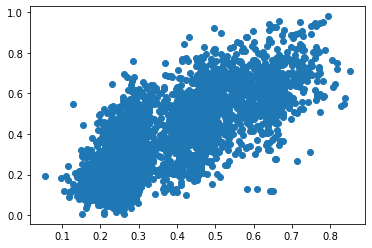

In [168]:
plt.scatter(Prediction, y_test)

In [169]:
## You can it is not in a Straight line. 
## So we deploy Lasso and Ridge 

from sklearn.linear_model import Lasso, Ridge

In [171]:
LA = Lasso()
RD = Ridge()

In [172]:
LA.fit(X_train, y_train)

Lasso()

In [173]:
RD.fit(X_train, y_train)

Ridge()

In [174]:
LA.intercept_

array([0.39827172])

In [175]:
LA.coef_

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        , -0.        ,  0.0004054 , -0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.00010914, -0.00013567])

In [176]:
RD.intercept_

array([0.26508958])

In [177]:
RD.coef_

array([[ 1.67781737e-01, -3.00147161e-02, -1.62926105e-01,
        -2.40254118e-02,  6.44530198e-02,  1.12527879e-01,
         3.99853346e-02, -7.72827794e-05,  5.47633524e-04,
         3.72643687e-03,  1.27659924e-03,  2.17206062e-03,
         9.32426494e-04, -8.40476083e-05, -1.12994741e-04]])

In [178]:
P_LA = LA.predict(X_test)

In [179]:
P_LA

array([0.34040288, 0.38146595, 0.31126673, ..., 0.18376347, 0.34745358,
       0.25933932])

In [180]:
P_RD = RD.predict(X_test)

In [181]:
P_RD

array([[0.27586419],
       [0.29615451],
       [0.25763171],
       ...,
       [0.13940181],
       [0.46372265],
       [0.20106735]])

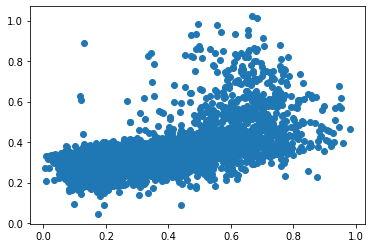

In [185]:
plt.scatter(y_test, P_LA)

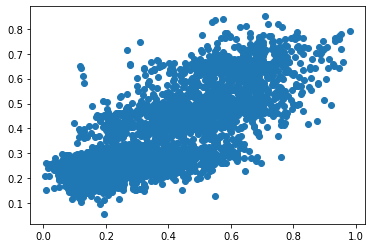

In [184]:
plt.scatter(y_test, P_RD)

In [186]:
def rmse(target, prediction):
    return np.sqrt(np.mean(np.square(target,prediction)))

In [187]:
rmse(y_test, Prediction)

Target    0.400416
dtype: float64

In [189]:
rmse(y_test,P_RD)

Target    0.400416
dtype: float64